## Imports

In [1]:
from data_utils import load_numpy_data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow import keras
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

2023-11-22 11:23:27.845027: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-22 11:23:28.487219: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


## Load data

In [2]:
DATA_PATH = "../Data55toAmplitude"

FEATURES_FOLDER = f"{DATA_PATH}/plfluxes_simplepoly__pllabdata_20230625a_superK_slmcube_20230625_complsines-01sp_04/"
LABELS_FOLDER = f"{DATA_PATH}/slmcube_20230625_complsines-01sp_07_PSFWFs_file00/"

FEATURES_FILEPATH = f"{FEATURES_FOLDER}/all_fluxes.npy"

LABELS_FILEPATH = f"{LABELS_FOLDER}/complexsine_pupamp.npy"

In [3]:
n_points = 10000

fluxes_array = load_numpy_data(FEATURES_FILEPATH, 
                               n_points)

amplitudes_array = load_numpy_data(LABELS_FILEPATH,
                                   n_points)

In [4]:
fluxes_array.shape

(10000, 55, 24)

In [5]:
amplitudes_array.shape

(10000, 96, 96)

In [6]:
amplitudes_array[0]

array([[0.75529766, 0.74080541, 0.72492366, ..., 0.74851699, 0.74374716,
        0.73740004],
       [0.74385875, 0.72808223, 0.71098318, ..., 0.74748685, 0.74128712,
        0.733548  ],
       [0.73117559, 0.71416848, 0.69591074, ..., 0.74510106, 0.73749828,
        0.72840051],
       ...,
       [0.71020046, 0.72198665, 0.73240433, ..., 0.65933348, 0.67975827,
        0.69911217],
       [0.71787564, 0.72840051, 0.73749828, ..., 0.67649959, 0.69591074,
        0.71416848],
       [0.72432959, 0.733548  , 0.74128712, ..., 0.69265279, 0.71098318,
        0.72808223]])

In [7]:
fig = px.imshow(amplitudes_array[0])
fig.show()

In [8]:
fig = px.imshow(fluxes_array[0])

In [9]:
fig.show()

In [4]:
def plot_model_history(
    history):
    """
    Plots the history of the model in a graph

    Input:
        history (): The training history of the model

    Returns:
        None
    """
    results = pd.DataFrame(history.history)
    results.plot(figsize=(8,5))
    plt.grid(True)
    plt.xlabel('Epochs')
    plt.ylabel('Mean Squared Error')
    plt.ylim(top=0.5, bottom=0)
    
    plt.show()

    return None


In [22]:
print(fluxes_array[0])
fluxes_array = fluxes_array.reshape(10000, 55*24)
fluxes_array.shape
print(fluxes_array[0])
print(fluxes_array[1])

[[ 525.5    712.327  857.139 ... 1385.53  1274.248  930.112]
 [ 221.06   404.502  727.024 ...  477.1    588.697  561.227]
 [ 372.477  511.366  713.259 ...  301.975  428.136  416.271]
 ...
 [ 181.267  199.039  290.146 ...  382.527  278.703  225.516]
 [ 371.59   344.726  298.876 ...  273.598  286.006  241.276]
 [ 413.485  336.133  189.326 ...  180.484  239.789  238.953]]
[525.5   712.327 857.139 ... 180.484 239.789 238.953]
[587.5   777.327 920.139 ...  81.484 140.789 152.953]


In [ ]:
model = models.Sequential([layers.InputLayer(input_shape=fluxes_array[0].shape),
                          layers.Dense(1024, activation='relu'),
                          layers.Dense(256, activation='relu'),
                          layers.Dense(1024, activation='relu'),
                          layers.Dense(96 * 96, activation='linear'),
                          layers.Reshape((96,96))
                          ])

model.compile(optimizer='adam', loss='mean_squared_error')
history = model.fit(fluxes_array, amplitudes_array, epochs=100, batch_size=16, validation_split=0.2)

2023-11-22 09:41:11.231224: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 09:41:11.362194: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 09:41:11.362449: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Epoch 1/100


2023-11-22 09:41:14.939144: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-11-22 09:41:14.957018: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fb58c8d2a60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-11-22 09:41:14.957050: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2023-11-22 09:41:14.987730: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-11-22 09:41:15.249497: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-11-22 09:41:15.447212: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifeti

500/500 [==============================] - 6s 5ms/step - loss: 76.7898 - val_loss: 0.0326
Epoch 2/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0292 - val_loss: 0.0295
Epoch 3/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0288 - val_loss: 0.0295
Epoch 4/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0288 - val_loss: 0.0295
Epoch 5/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0289 - val_loss: 0.0295
Epoch 6/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0289 - val_loss: 0.0295
Epoch 7/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0289 - val_loss: 0.0295
Epoch 8/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0289 - val_loss: 0.0295
Epoch 9/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0289 - val_loss: 0.0295
Epoch 10/100
500/500 [==============================] - 2s 5ms/step - loss: 0.0289 - val_loss: 0.0296


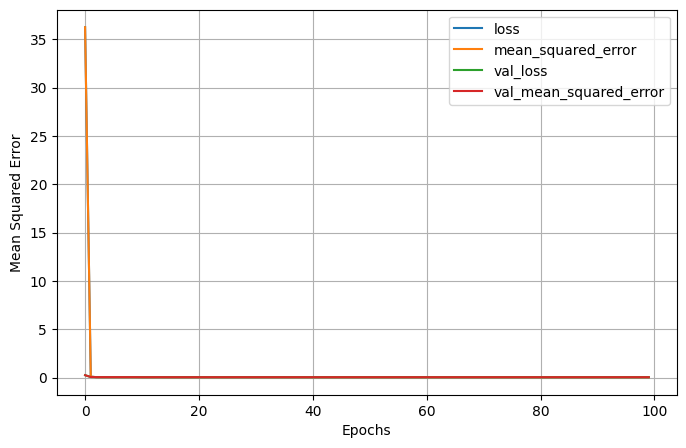

In [17]:
plot_model_history(history)

In [13]:
fig = px.imshow(amplitudes_array[4])
fig.show()
im = model.predict(fluxes_array[4].reshape(1, 1320))
print(fluxes_array[0].reshape(1, 55, 24))
print(fluxes_array[0])
fig = px.imshow(im[0])
fig.show()

NameError: name 'model' is not defined

Another

In [14]:
model = models.Sequential()

model.add(layers.InputLayer(input_shape=fluxes_array[0].shape))
# Adding a fully connected layer with 128 units and 'relu' activation function
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1024, activation='relu'))
# Adding the output layer with 10 units (for example, for 10 classes) and 'softmax' activation function
model.add(layers.Dense(96 * 96, activation='linear'))
model.add(layers.Reshape((96,96)))
# Printing the summary of the model architecture
model.summary()


# Compilation hyperparameters
loss_function = tf.keras.losses.MeanSquaredError()
learning_rate = 0.0001
optimizer = Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999)
metric = tf.keras.metrics.MeanSquaredError()

model.compile(loss=loss_function,optimizer=optimizer,metrics=[metric])
history = model.fit(fluxes_array, amplitudes_array, epochs=100, batch_size=16, validation_split=0.2)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              1352704   
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dense_3 (Dense)             (None, 512)               131584    
                                                                 
 dense_4 (Dense)             (None, 1024)              525312    
                                                                 
 dense_5 (Dense)             (None, 9216)              9446400   
                                                                 
 reshape (Reshape)           (None, 96, 96)            0

2023-11-22 09:42:43.600320: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 09:42:43.638033: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 09:42:43.638365: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Epoch 1/100


2023-11-22 09:42:46.912392: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-11-22 09:42:46.914560: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fc34b2a5e50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-11-22 09:42:46.914603: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2023-11-22 09:42:46.919304: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-11-22 09:42:47.087666: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-11-22 09:42:47.205833: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifeti

500/500 [==============================] - 6s 7ms/step - loss: 36.2522 - mean_squared_error: 36.2522 - val_loss: 0.2401 - val_mean_squared_error: 0.2401
Epoch 2/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0908 - mean_squared_error: 0.0908 - val_loss: 0.0482 - val_mean_squared_error: 0.0482
Epoch 3/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0404 - val_mean_squared_error: 0.0404
Epoch 4/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0381 - val_mean_squared_error: 0.0381
Epoch 5/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0385 - val_mean_squared_error: 0.0385
Epoch 6/100
500/500 [==============================] - 3s 6ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0380 - val_mean_squared_error: 0.0380
Epoch 7/100
500/500 [===========

500/500 [==============================] - 3s 5ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0299 - val_mean_squared_error: 0.0299
Epoch 52/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0295 - mean_squared_error: 0.0295 - val_loss: 0.0298 - val_mean_squared_error: 0.0298
Epoch 53/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0294 - mean_squared_error: 0.0294 - val_loss: 0.0298 - val_mean_squared_error: 0.0298
Epoch 54/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0293 - mean_squared_error: 0.0293 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 55/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0293 - mean_squared_error: 0.0293 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 56/100
500/500 [==============================] - 3s 5ms/step - loss: 0.0293 - mean_squared_error: 0.0293 - val_loss: 0.0307 - val_mean_squared_error: 0.0307
Epoch 57/100
500/500 [=======

In [44]:
n=1102
fig = px.imshow(amplitudes_array[n])
fig.show()
im = model.predict(fluxes_array[n].reshape(1, 1320))
fig = px.imshow(im[0])
fig.show()

1/1 [==============================] - 0s 16ms/step


In [43]:
n=8002
fig = px.imshow(amplitudes_array[n])
fig.show()
im = model.predict(fluxes_array[n].reshape(1, 1320))
fig = px.imshow(im[0])
fig.show()

1/1 [==============================] - 0s 16ms/step


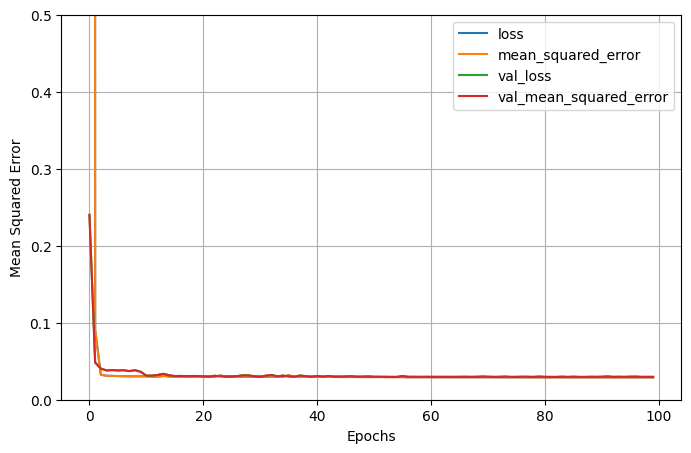

In [32]:
plot_model_history(history)

Another

In [46]:
fluxes_array = load_numpy_data(FEATURES_FILEPATH, 
                               n_points)

amplitudes_array = load_numpy_data(LABELS_FILEPATH,
                                   n_points)

In [5]:
model = models.Sequential()
input_shape = fluxes_array[0].shape + (1, )
# Adding a convolutional layer with 32 filters, a 3x3 kernel, and 'relu' activation function
model.add(Conv2D(256, (3, 3), activation='relu', input_shape=input_shape))

# Adding another convolutional layer with 64 filters, a 3x3 kernel, and 'relu' activation function
model.add(Conv2D(64, (3, 3), activation='relu'))

# Adding another max-pooling layer with a 2x2 pool size
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flattening the 3D output to 1D tensor for a fully connected layer
model.add(Flatten())

# Adding a fully connected layer with 128 units and 'relu' activation function
model.add(Dense(128, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(1024, activation='relu'))

# Adding the output layer with 10 units (for example, for 10 classes) and 'softmax' activation function
model.add(layers.Dense(96 * 96, activation='linear'))
model.add(layers.Reshape((96,96)))
# Printing the summary of the model architecture
model.summary()


# Compilation hyperparameters
loss_function = tf.keras.losses.MeanSquaredError()
learning_rate = 0.0001
optimizer = Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999)
metric = tf.keras.metrics.MeanSquaredError()

model.compile(loss=loss_function,optimizer=optimizer,metrics=[metric])
history = model.fit(fluxes_array, amplitudes_array, epochs=100, batch_size=16, validation_split=0.2)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 53, 22, 256)       2560      
                                                                 
 conv2d_1 (Conv2D)           (None, 51, 20, 64)        147520    
                                                                 
 max_pooling2d (MaxPooling2  (None, 25, 10, 64)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 16000)             0         
                                                                 
 dense (Dense)               (None, 128)               2048128   
                                                                 
 dense_1 (Dense)             (None, 512)               66048     
                                                        

2023-11-22 11:23:46.839065: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 11:23:46.877397: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-22 11:23:46.877664: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Epoch 1/100


2023-11-22 11:23:49.880726: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-11-22 11:23:50.681971: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-11-22 11:23:50.684460: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f6207c1b6a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-11-22 11:23:50.684483: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2023-11-22 11:23:50.688726: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-11-22 11:23:50.812945: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifeti

500/500 [==============================] - 9s 10ms/step - loss: 0.6629 - mean_squared_error: 0.6629 - val_loss: 0.0297 - val_mean_squared_error: 0.0297
Epoch 2/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 3/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 4/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 5/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 6/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 7/100
500/500 [=======

Epoch 51/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 52/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 53/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 54/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 55/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 56/100
500/500 [==============================] - 5s 10ms/step - loss: 0.0288 - mean_squared_error: 0.0288 - val_loss: 0.0295 - val_mean_squared_error: 0.0295
Epoch 57/1

500/500 [==============================] - 5s 10ms/step - loss: 0.0289 - mean_squared_error: 0.0289 - val_loss: 0.0295 - val_mean_squared_error: 0.0295


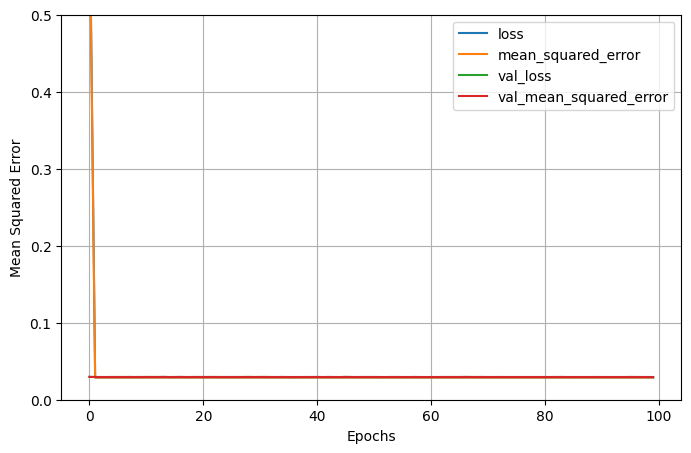

In [6]:
plot_model_history(history)

In [7]:
n=1000
fig = px.imshow(amplitudes_array[n])
fig.show()
im = model.predict(fluxes_array[n].reshape(1, 55, 24))
print(fluxes_array[0].reshape(1, 55, 24))
print(fluxes_array[0])
fig = px.imshow(im[0])
fig.show()

1/1 [==============================] - 0s 168ms/step
[[[ 525.5    712.327  857.139 ... 1385.53  1274.248  930.112]
  [ 221.06   404.502  727.024 ...  477.1    588.697  561.227]
  [ 372.477  511.366  713.259 ...  301.975  428.136  416.271]
  ...
  [ 181.267  199.039  290.146 ...  382.527  278.703  225.516]
  [ 371.59   344.726  298.876 ...  273.598  286.006  241.276]
  [ 413.485  336.133  189.326 ...  180.484  239.789  238.953]]]
[[ 525.5    712.327  857.139 ... 1385.53  1274.248  930.112]
 [ 221.06   404.502  727.024 ...  477.1    588.697  561.227]
 [ 372.477  511.366  713.259 ...  301.975  428.136  416.271]
 ...
 [ 181.267  199.039  290.146 ...  382.527  278.703  225.516]
 [ 371.59   344.726  298.876 ...  273.598  286.006  241.276]
 [ 413.485  336.133  189.326 ...  180.484  239.789  238.953]]
